In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
import pandas as pd
import numpy as mp

# This is a Colab notebok!

## End to End Multi-sclasses Dog breed classification

this notebook builds and end-to-end multi-class image classifier using tensorFlow 2.0 and tensorFlow Hub

### 1. Problem
### 2. Data
### 3. Evaluation
### 4. Features

In [3]:
import tensorflow as tf

print(tf.__version__)

2.17.0


In [4]:
import tensorflow_hub as hub
print(hub.__version__)

0.16.1


In [6]:
# Check for GPU availability
print("GPU", "available" if tf.config.list_physical_devices("GPU") else "not available")

GPU available


## Tensorflow with GPU

This notebook provides an introduction to computing on a [GPU](https://cloud.google.com/gpu) in Colab. In this notebook you will connect to a GPU, and then run some basic TensorFlow operations on both the CPU and a GPU, observing the speedup provided by using the GPU.

## Enabling and testing the GPU

First, you'll need to enable GPUs for the notebook:

- Navigate to Edit→Notebook Settings
- select GPU from the Hardware Accelerator drop-down

Next, we'll confirm that we can connect to the GPU with tensorflow:

In [7]:
import tensorflow as tf
device_name = tf.test.gpu_device_name()
if device_name != '/device:GPU:0':
  raise SystemError('GPU device not found')
print('Found GPU at: {}'.format(device_name))

Found GPU at: /device:GPU:0


## Observe TensorFlow speedup on GPU relative to CPU

This example constructs a typical convolutional neural network layer over a
random image and manually places the resulting ops on either the CPU or the GPU
to compare execution speed.

In [8]:
import tensorflow as tf
import timeit

device_name = tf.test.gpu_device_name()
if device_name != '/device:GPU:0':
  print(
      '\n\nThis error most likely means that this notebook is not '
      'configured to use a GPU.  Change this in Notebook Settings via the '
      'command palette (cmd/ctrl-shift-P) or the Edit menu.\n\n')
  raise SystemError('GPU device not found')

def cpu():
  with tf.device('/cpu:0'):
    random_image_cpu = tf.random.normal((100, 100, 100, 3))
    net_cpu = tf.keras.layers.Conv2D(32, 7)(random_image_cpu)
    return tf.math.reduce_sum(net_cpu)

def gpu():
  with tf.device('/device:GPU:0'):
    random_image_gpu = tf.random.normal((100, 100, 100, 3))
    net_gpu = tf.keras.layers.Conv2D(32, 7)(random_image_gpu)
    return tf.math.reduce_sum(net_gpu)

# We run each op once to warm up; see: https://stackoverflow.com/a/45067900
cpu()
gpu()

# Run the op several times.
print('Time (s) to convolve 32x7x7x3 filter over random 100x100x100x3 images '
      '(batch x height x width x channel). Sum of ten runs.')
print('CPU (s):')
cpu_time = timeit.timeit('cpu()', number=10, setup="from __main__ import cpu")
print(cpu_time)
print('GPU (s):')
gpu_time = timeit.timeit('gpu()', number=10, setup="from __main__ import gpu")
print(gpu_time)
print('GPU speedup over CPU: {}x'.format(int(cpu_time/gpu_time)))

Time (s) to convolve 32x7x7x3 filter over random 100x100x100x3 images (batch x height x width x channel). Sum of ten runs.
CPU (s):
3.7160843919999706
GPU (s):
0.12411672799998996
GPU speedup over CPU: 29x


##Getting our data ready
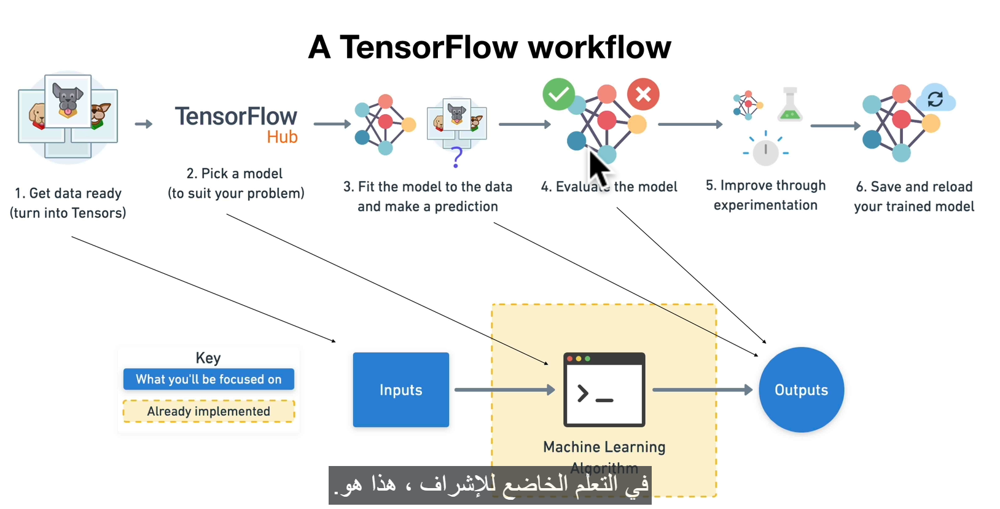

In [5]:
import pandas as pd
labels_csv =pd.read_csv("/content/drive/MyDrive/ML_project/dog vision/labels.csv")

In [7]:
labels_csv.describe()


,id,breed
count,10222,10222
unique,10222,120
top,000bec180eb18c7604dcecc8fe0dba07,scottish_deerhound
freq,1,126


In [8]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [9]:
labels_csv.describe()

,id,breed
count,10222,10222
unique,10222,120
top,000bec180eb18c7604dcecc8fe0dba07,scottish_deerhound
freq,1,126


In [10]:
labels_csv["breed"].value_counts()

,count
breed,
scottish_deerhound,126
maltese_dog,117
afghan_hound,116
entlebucher,115
bernese_mountain_dog,114
...,...
golden_retriever,67
brabancon_griffon,67
komondor,67


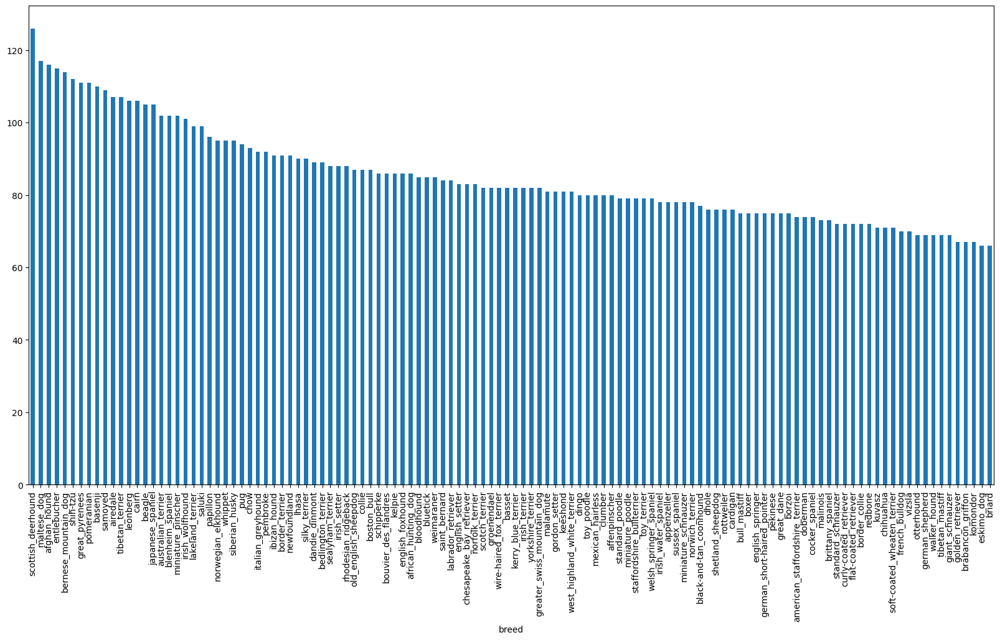

In [11]:
# how many image there of each breed ?
labels_csv["breed"].value_counts().plot.bar(figsize=(20,10));

In [12]:
labels_csv["breed"].value_counts().median()

82.0

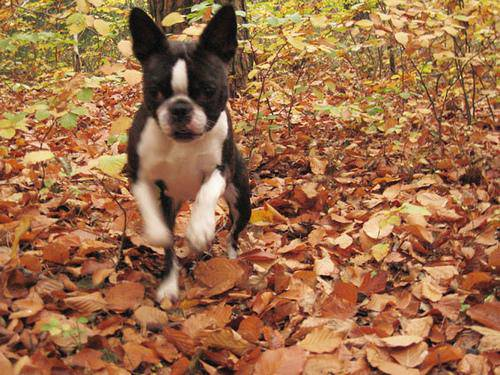

In [13]:
# let's view an image
from IPython.display import Image
Image("/content/drive/MyDrive/ML_project/dog vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg")

## Getting image into their labels
let's get list of all for our image file pathnames

In [14]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [23]:
labels_csv.shape

(10222, 2)

In [18]:
# create pathnames from image ID's
path = "/content/drive/MyDrive/ML_project/dog vision/train/"
filenames = [path + fnames +".jpg" for fnames in labels_csv["id"]]
filenames[:10]

['/content/drive/MyDrive/ML_project/dog vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/drive/MyDrive/ML_project/dog vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '/content/drive/MyDrive/ML_project/dog vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 '/content/drive/MyDrive/ML_project/dog vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '/content/drive/MyDrive/ML_project/dog vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 '/content/drive/MyDrive/ML_project/dog vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 '/content/drive/MyDrive/ML_project/dog vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 '/content/drive/MyDrive/ML_project/dog vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 '/content/drive/MyDrive/ML_project/dog vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 '/content/drive/MyDrive/ML_project/dog vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [19]:
# check whether number of filenames matches number of actual image files
import os
if len(os.listdir("/content/drive/MyDrive/ML_project/dog vision/train/"))==len(filenames):
  print("Number of filenames matches the number of image files")
else:
  print("Number of filenames does not matches the number of image files")

Number of filenames does not matches the number of image files


In [22]:
len_train_folder = len(os.listdir("/content/drive/MyDrive/ML_project/dog vision/train/"))
len_train_folder , len(filenames)

(10241, 10222)

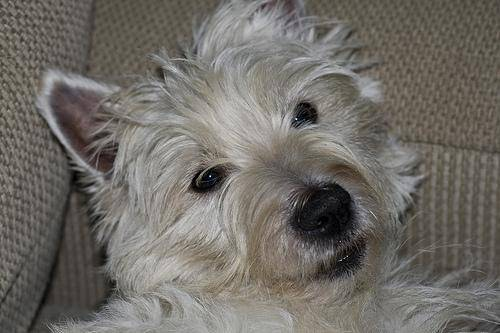

In [27]:
# one more check
filenames[9010]
Image(filenames[9010])

In [24]:
# we need to know to breed the last image the row 9000
labels_csv['breed'][9010]

'west_highland_white_terrier'

Since we've now got our training image filepaths in a list , let's prepare our labels.

In [32]:
import numpy as np
labels = labels_csv["breed"].to_numpy()
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [29]:
len(labels)

10222

In [30]:
# see if number of labels matches the number of filenames
if len(labels)==len(filenames):
  print("Number of labels matches the number of filenames")
else:
  print("Number of labels does not matches the number of filenames")

Number of labels matches the number of filenames


In [31]:
# find the unique labels values
unique_breeds = np.unique(labels)
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [34]:
len(unique_breeds) , len(labels)

(120, 10222)

In [35]:
# turn a single labels into an array of booleans
print(labels[0])
labels[0]==unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [36]:
# turn every label into a boolean array
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [38]:
len(boolean_labels)

10222

In [39]:
# example : truning boolean array into integers
print(labels[0]) # original label
print(np.where(unique_breeds==labels[0])) # index where label occurs
print(boolean_labels[0].argmax()) # index where label occurs in boolean array
print(boolean_labels[0].astype(int)) # there will be a 1 where the sample label occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [40]:
print(labels[2])
print(boolean_labels[2].argmax())
print(boolean_labels[2].astype(int))

pekinese
85
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [41]:
filenames[:10]

['/content/drive/MyDrive/ML_project/dog vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/drive/MyDrive/ML_project/dog vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '/content/drive/MyDrive/ML_project/dog vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 '/content/drive/MyDrive/ML_project/dog vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '/content/drive/MyDrive/ML_project/dog vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 '/content/drive/MyDrive/ML_project/dog vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 '/content/drive/MyDrive/ML_project/dog vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 '/content/drive/MyDrive/ML_project/dog vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 '/content/drive/MyDrive/ML_project/dog vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 '/content/drive/MyDrive/ML_project/dog vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

## Creatin our own validation set
Since the dataset from kaggle doesn't come with a validation set  , we're going to create our own

In [42]:
# setup X and y variables
X =filenames
y = boolean_labels

In [43]:
len(filenames)

10222

we're going to start off experiemnting with ~1000 images and increase as needed.

In [44]:
# set number of images to usr for experiementing
NUM_IMAGES = 1000 #@param {type:'slider' , min:1000 , max:10000}

In [45]:
# let's split our data into train and validation sets
from sklearn.model_selection import train_test_split
np.random.seed(42)
# split them into training and validation of total size NUM_IMAGES
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size=0.2,
                                                  random_state=42)
len(X_train), len(y_train), len(X_val), len(y_val)

(800, 800, 200, 200)

In [46]:
# let's have a geez at the training data
X_train[:5]  , y_train[:2]

(['/content/drive/MyDrive/ML_project/dog vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
  '/content/drive/MyDrive/ML_project/dog vision/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  '/content/drive/MyDrive/ML_project/dog vision/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
  '/content/drive/MyDrive/ML_project/dog vision/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
  '/content/drive/MyDrive/ML_project/dog vision/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, 

## Preprocessing images (tunning images into tensors)

To preprocess our images into Tensors we're going to write a fucntion which does a few things:

1. Take an image filepath as input
2. use TensorFlow to read the file and save it to a variable , `image`
3. turn our `image` a (jpg) into Tensors
4. Normalize our image (convert color channel values from from 255-0 to 0-1)
5. resize the `image` to be a shape of (224 , 224)
6. return the modified `image`

* https://www.tensorflow.org/tutorials/load_data/images
* https://www.tensorflow.org/guide/data

In [47]:
# Convert image to Numpy array
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape

(257, 350, 3)

In [48]:
image[:2]

array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)

In [49]:
# turn image into a tensor to run on Gpu
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)>

Now we've seen what an image looks like as a Tensors , let's make a function to preprocess them.

1. Take an image filepath as input
2. use TensorFlow to read the file and save it to a variable , `image`
3. turn our `image` a (jpg) into Tensors
4. resize the `image` to be a shape of (224 , 224)
5. return the modified `image`

In [50]:
# Define image size
IMG_SIZE = 224

# Create a function to preprocessing images

def process_image(image_path , img_size=IMG_SIZE):
  """
  Takes an image file path and turns it into a Tensor.
  """
  # Read in image file
  image = tf.io.read_file(image_path)
  # Turn the jpeg image into numerical Tensor with 3 color channels (Red, Green, Blue)
  image = tf.image.decode_jpeg(image, channels=3)
  # Convert the color channel values from 0-255 to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)
  # resize the image to our desired value (224,224)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

  return image


## Turning our data into a batches
why turn our data into batches

Let's say you're trying process 10,000+ image in one go , they all might not fit into memory

so that's why we do about 32 (this is batch size ) images at time (you can manually adjust the batch size if need be ).

In order to use TensorFlow effectively , we need our data in the form of Tesnor tuples which look like this

`(image ,label)`

In [51]:
#create a simple function to return a tuple (image , label)
def get_image_label(image_path , label):
  """
  Takes an image file path name and the associated label,
  processes the image and returns a tuple of (image , label).
  """
  image = process_image(image_path)
  return image , label

In [52]:
# demo of the above
(process_image(X[42]), tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117759],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

we've got away to turn our data into tuples of Tensors un the form : `(image , label)` , let's make a funcion to turn all of our data (X & y) into batches.

In [53]:
# define the batch size , 32 is good start
BATCH_SIZE= 32

# create a function to turn data into batches
def create_data_batches(X , y=None , batch_size=BATCH_SIZE ,valid_data=False , test_data=False):
  """
  Creates batches of data out of image (X) and label (y) pairs.
  Shuffles the data if it's training data but doesn't shuffle if it's validation data.
  Also accepts test data as input (no label).
  """
  # If the data is a test dataset , we probably don't have labels
  if test_data:
    data = tf.data.Dataset.from_tensor_slices(tf.constant(X)) #only filepaths (no labels)
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  # If data is a valid dataset , we don't need to shuffle it
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), #filepaths
                                               tf.constant(y))) # labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print("creating training batches ...")
    # Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                               tf.constant(y)))
    # shuffling pathnames and labels before mapping image processor function is faster than shufflin images
    data = data.shuffle(buffer_size=len(X))
    # create (image , label) tuples (this also turn image path into a preprocessing image)
    data = data.map(get_image_label)
    # trun the training data into batches
    data_batch = data.batch(BATCH_SIZE)
    return data_batch






In [55]:
# create training and validation data batches
train_data = create_data_batches(X_train , y_train)
val_data = create_data_batches(X_val , y_val , valid_data=True)


creating training batches ...
Creating validation data batches...


In [56]:
# check out the different attributes of our data batches
train_data.element_spec , val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## visualizing Data Batches

Our data is now batches , however , these can be a little hard to understand / comprehend  , let's visualize the batches



In [74]:
import matplotlib.pyplot as plt

# Create a function for viewing images in a data batch
def show_25_images(images, labels):
  """
  Displays a plot of 25 images and their labels from a data batch.
  """
  # Setup the figure
  plt.figure(figsize=(10, 10))
  # Loop through 25 (for displaying 25 images)
  for i in range(25):
    # Create subplots (5 rows, 5 columns)
    ax = plt.subplot(5, 5, i+1)
    # Display an image
    plt.imshow(images[i])
    # Add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])
    # Turn the grid lines off
    plt.axis("off")

In [63]:
len(filenames) , len(boolean_labels)

(10222, 10222)

In [76]:
train_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [66]:
train_images , train_labels = next(train_data.as_numpy_iterator()) # for store tensorFlow dataset as numpy arrays
train_images , train_labels                                        #  next()  function retrieves the next item from an iterator fetch the next batch from data

(array([[[[0.05288405, 0.03378852, 0.01893383],
          [0.06739181, 0.05170553, 0.03994082],
          [0.0761371 , 0.0719004 , 0.06500265],
          ...,
          [0.10196079, 0.06666667, 0.04705883],
          [0.08960081, 0.07118351, 0.05490196],
          [0.08627451, 0.07450981, 0.05490196]],
 
         [[0.04944345, 0.03782021, 0.02950806],
          [0.05081212, 0.04261009, 0.03334013],
          [0.05823448, 0.05419825, 0.04669908],
          ...,
          [0.10196079, 0.06666667, 0.04705883],
          [0.08960081, 0.07118351, 0.05490196],
          [0.08627451, 0.07450981, 0.05490196]],
 
         [[0.04540762, 0.04564397, 0.04611665],
          [0.03680762, 0.03371763, 0.02753766],
          [0.04199205, 0.0380135 , 0.03015137],
          ...,
          [0.10196079, 0.06666667, 0.04705883],
          [0.08960081, 0.07118351, 0.05490196],
          [0.08627451, 0.07450981, 0.05490196]],
 
         ...,
 
         [[0.6764975 , 0.520198  , 0.42101473],
          [0.80180

In [43]:
# len()
len(train_images) , len(train_labels)

(32, 32)

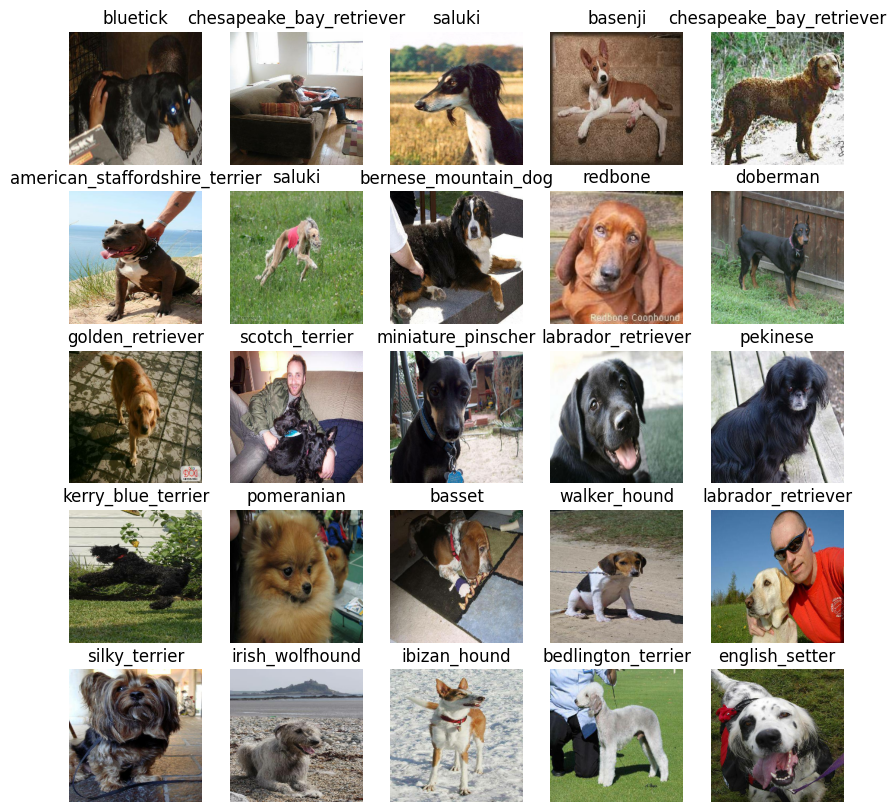

In [75]:
# now let's visualize the data in training batch
# show_25_images(train_images,train_labels)
# Assuming unique_breeds contains the list of breed names
show_25_images(train_images, train_labels)


In [77]:
# let's visualize our validation set
val_images , val_labels  = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels, unique_breeds)

TypeError: show_25_images() takes 2 positional arguments but 3 were given

## Building a model

Before we build a model , there are few things we need to define :     
* The `input` shape (our images shape , in the form of Tensors ) to our model.
* The `output` shape (image labels , in the form of Tensors ) of our model.
* the `URL` of the model we want to use from Tensorflow Hub https://www.kaggle.com/models?tfhub-redirect=true

In [78]:
IMG_SIZE

224

In [146]:
# Setup input shape to the model
INPUT_SHAPE = [None ,IMG_SIZE, IMG_SIZE, 3] # batch, height, width, colour channels

# Setup output shape of our model
OUTPUT_SHAPE = len(unique_breeds)

# Setup model URL from TensorFlow Hub
MODEL_URL = "https://kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/1"

Documentatin Keras

* https://www.tensorflow.org/guide/keras

differnce between `sequential` and `functional` Api

1. `keras sequential API ` :    
        * The Sequential API is the simplest way to build a model in Keras.
         It allows you to stack layers one after another in a linear manner.
         This API is perfect for building models where each layer has exactly
         one input tensor and one output tensor
          (e.g., simple feedforward networks, Convolutional Neural Networks).

        * `caracteristics`:
           1. `Simple and linear structure`: Layers are added one by one in sequence.
           2. `One input and one output`: The flow of data is straightforward.
           3. `Easy to use`: Suitable for beginners and for simple models.

2. `Keras Functional API` :      
       * The Functional API provides much more flexibility compared to
        the Sequential API. It allows you to build models with complex architectures
        such as:
           * Multiple inputs or outputs
           * Shared layers
           * Non-linear data flows, such as branching or merging paths
            (e.g., residual connections, or multi-branch networks like Inception models).
        * `caracteristics` :              
           1. `Flexible and powerful`: You can build almost any model architecture
           2. `Non-linear architectures`: Supports models with multiple
           inputs, outputs,
            or even layers that merge or split.
           3. `Explicit input/output definition`: You explicitly define input and
            output tensors, giving more control over how layers are connected.


Now we've got our inputs , outputs and model ready to go.
Let's put them together into a keras deep learning model.

Let's create function  which :    
* Takes the input shape , output shape and the model we've chosen as parameter
* Defines the layers in a keras model in sequential fashion (do this first , then this , then that).
* compiles the model (says it should be evaluated and improved).
* Builds the model (tells the model the input shape it'll be getting).
* Retruns the model .

All these steps existe here in this link :      
* https://www.tensorflow.org/guide/keras




In [163]:
import tf_keras as keras

# Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # batch, height, width, colour channels

# Setup output shape of our model
OUTPUT_SHAPE = len(unique_breeds)

# Setup model URL from TensorFlow Hub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"

# Create a function which builds a Keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with:", MODEL_URL)

  # Setup the model layers
  model = keras.Sequential([
    hub.KerasLayer(MODEL_URL), # Layer 1 (input layer)
    keras.layers.Dense(units=OUTPUT_SHAPE,
                          activation="softmax") # Layer 2 (output layer)
  ])

  # Compile the model
  model.compile(
      loss=keras.losses.CategoricalCrossentropy(),
      optimizer=keras.optimizers.Adam(),
      metrics=["accuracy"]
  )

  # Build the model
  model.build(INPUT_SHAPE)

  return model

In [164]:
model = create_model()
model.summary()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Model: "sequential_8"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer_34 (KerasLayer  (None, 1001)              5432713   
 )                                                               
                                                                 
 dense_7 (Dense)             (None, 10)                10020     
                                                                 
Total params: 5442733 (20.76 MB)
Trainable params: 10020 (39.14 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


## Creation callbacks

Callback are helper functions a model can use during training to do such things as save its progress , check its progress or stop training early if a model stops improving .

we'll crate two callback , one for TensorBoard which helps track our models progress and another for early stopping which prevents our model from training for too long.

### TensorBoard Callback
to setup a TensorBoard callback , we need to do 3 things :    
1. Load the TensorBoard notebook extension
2. Create a TesnorBoard callback which is able to save to a directory and pass it to our model's `fit()` function.
3. Visualize our models training logs with the `%tensorboard` magic function(we'll do this after model training)

In [165]:
# Load TensorBoard notebook Extension
%load_ext tensorboard

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [166]:
import datetime

# craete a fucntion to build a TensorBoard callback
def create_tensorboard_callback():
  # create a log directory for storing TensorBoard logs
  logdir = os.path.join("/content/drive/MyDrive/ML_project/dog vision/log",
                      # make it so the logs get tracked whenever we run an experiment
                       datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

### Early stopping callback

Early stopping hepls top our model from overfitting by stopping training if a certain evaluation metric stops improving

In [155]:
# Create early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3)

## Training a model (on subset of data )

Our first model is only going to train on 1000 images , to make sure everything is working .

In [167]:
NUM_EPOCHS = 60 #@param {type:'slider' , min:10 , max:100 , step:10}


let's create a function which trains a model .

* Create a model using `create_model()`
* Setup a TensorBoard callback using `create_tensorboard_callback()`
* call the `fit()` function on our model passing it the training data  , validation data , number of epochs to train for (`NUM_EPOCHS`) and callbacks we'd like to use.
* return the model .

In [174]:
# Build a function to train and return a trained model
def train_model():
  """
  Trains a given model and returns the trained version.
  """

  # create a model
  model = create_model()

  # create new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # fit the model to the data passing it the callbacks we created
  model.fit(x=train_data ,
            epochs=NUM_EPOCHS ,
            validation_data = val_data ,
            validation_freq = 1 ,
            callbacks=[tensorboard , early_stopping])
  # return the fitted data
  return model

In [175]:
model = train_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4


ValueError: Only instances of `keras.Layer` can be added to a Sequential model. Received: <tensorflow_hub.keras_layer.KerasLayer object at 0x7ae9d7c31a50> (of type <class 'tensorflow_hub.keras_layer.KerasLayer'>)

In [176]:
import tensorflow as tf
import tensorflow_hub as hub

# Define constants
IMG_SIZE = 224  # Image size (height and width)
INPUT_SHAPE = [IMG_SIZE, IMG_SIZE, 3]  # Input shape for MobileNetV2
unique_breeds = ['breed1', 'breed2', 'breed3', 'breed4', 'breed5', 'breed6', 'breed7', 'breed8', 'breed9', 'breed10']  # Example
OUTPUT_SHAPE = len(unique_breeds)  # Number of classes

# Correct TensorFlow Hub URL
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/feature_vector/4"  # Feature extractor URL

def create_model():
    print("Building model with:", MODEL_URL)

    # Define input
    inputs = tf.keras.Input(shape=INPUT_SHAPE)

    # Load pre-trained model from TensorFlow Hub as a feature extractor
    feature_extractor = hub.KerasLayer(MODEL_URL, trainable=False)(inputs)

    # Add global average pooling
    x = tf.keras.layers.GlobalAveragePooling2D()(feature_extractor)

    # Add dense layer for classification
    outputs = tf.keras.layers.Dense(units=OUTPUT_SHAPE, activation="softmax")(x)

    # Create the model
    model = tf.keras.Model(inputs=inputs, outputs=outputs)

    # Compile the model
    model.compile(
        loss=tf.keras.losses.CategoricalCrossentropy(),
        optimizer=tf.keras.optimizers.Adam(),
        metrics=["accuracy"]
    )

    return model

# Example TensorBoard and EarlyStopping callbacks
def create_tensorboard_callback(log_dir="logs"):
    return tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)

def train_model():
    """
    Trains a given model and returns the trained version.
    """
    # Create a model
    model = create_model()

    # Create TensorBoard and EarlyStopping callbacks
    tensorboard = create_tensorboard_callback()
    early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=3)  # Example

    # Fit the model to the data
    history = model.fit(
        x=train_data,  # Training data
        epochs=NUM_EPOCHS,  # Number of epochs
        validation_data=val_data,  # Validation data
        validation_freq=1,  # Frequency of validation
        callbacks=[tensorboard, early_stopping]  # List of callbacks
    )

    # Return the trained model and training history
    return model, history

# Example usage
model, history = train_model()


Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/feature_vector/4


ValueError: Exception encountered when calling layer 'keras_layer_39' (type KerasLayer).

A KerasTensor is symbolic: it's a placeholder for a shape an a dtype. It doesn't have any actual numerical value. You cannot convert it to a NumPy array.

Call arguments received by layer 'keras_layer_39' (type KerasLayer):
  • inputs=<KerasTensor shape=(None, 224, 224, 3), dtype=float32, sparse=None, name=keras_tensor>
  • training=None

## Checking the TesnorBoard logs

the TensorFlow magic function (%Tensorboard) will access the logs directory we created earlier and visualize its contents.

In [91]:
%tensorboard --logdir drive/My\ Drive/ML_project/dog\ vision/log

# /content/drive/MyDrive/ML_project/dog vision/log

<IPython.core.display.Javascript object>

## Making and evaluating predictions using trained model

In [92]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [157]:
# Make predictions on the validation data (not used to train on)
predictions = model.predict(val_data , verbose=1)
predictions

7/7 [==============================] - 59s 9s/step


array([[0.41740426, 0.00770823, 0.0207547 , ..., 0.00557126, 0.04393617,
        0.00562754],
       [0.09488021, 0.32733697, 0.02298868, ..., 0.1928234 , 0.05282236,
        0.03880612],
       [0.04873053, 0.3356138 , 0.01253641, ..., 0.00793325, 0.02724991,
        0.0356181 ],
       ...,
       [0.00333318, 0.02211062, 0.1257677 , ..., 0.00190024, 0.712354  ,
        0.00436926],
       [0.10374304, 0.21607356, 0.01186227, ..., 0.02196017, 0.12533039,
        0.04030094],
       [0.2347016 , 0.06703217, 0.12169517, ..., 0.04833976, 0.02020705,
        0.05050531]], dtype=float32)

In [158]:
predictions.shape

(200, 10)

In [159]:
len(predictions)

200

In [ ]:
len(unique_breeds)

120

In [62]:
# make first prediction
index=43
print(predictions[index])
print(f"Max value (probabilities of prediction): {np.max(predictions[index])}")
print(f"Sum : {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"predicted label: {unique_breeds[np.argmax(predictions[index])]}")

[1.60822470e-03 4.43560042e-04 3.85187363e-04 5.99977029e-05
 3.28610797e-04 2.50904268e-04 3.32042291e-05 4.57280222e-03
 1.71725987e-04 3.12289485e-05 1.07949425e-04 2.31504776e-02
 4.05931823e-05 1.64250601e-02 2.36283959e-05 3.17360129e-04
 2.18645900e-01 2.13118663e-04 3.25965509e-03 8.15965608e-03
 1.85922458e-04 2.32980485e-04 1.93710963e-04 5.95587062e-06
 2.89799500e-04 1.49997832e-05 8.11665159e-05 2.04038201e-03
 2.71653611e-04 5.11587225e-03 2.01477116e-04 4.69863262e-05
 6.94817340e-04 5.76376915e-01 1.75144029e-04 1.83742537e-04
 8.65864858e-05 1.78585069e-05 1.77226066e-05 1.24258033e-04
 3.45945219e-03 6.14192759e-05 6.20028513e-05 2.76433675e-05
 1.38212950e-03 3.88240078e-05 2.85337846e-05 1.82904594e-04
 7.88566947e-04 2.65599112e-04 3.12897937e-05 9.45543288e-05
 2.71952990e-03 2.88449926e-04 1.60847325e-03 1.02199883e-04
 3.62408668e-04 2.47367134e-04 1.75948189e-05 4.05039958e-04
 1.03909035e-04 5.05961999e-02 3.57248326e-04 4.76658934e-05
 3.61773447e-04 9.915499

In [173]:
predictions.shape

(200, 10)

In [63]:
unique_breeds[11]

'bernese_mountain_dog'

Prediction of pobabilities are also known a confidence levels

In [64]:
#Turn Prediction Probabilities into their respective label (easier to understand)
def get_pred_label(prediction_probabilities):

  return unique_breeds[np.argmax(prediction_probabilities)]

# Get a predicted label based on an array of prediction probabilities
pred_label = get_pred_label(predictions[89])
pred_label

'pembroke'

Now since our validation data is still in a batch dataset , we'll have to unbatchify it to make predictions on the vlidation images and then compare those predictions to the validation labels (truth labels).

In [65]:
# create a function to unbatch a batch dataset
def unbatchfy(data):
  images = []
  labels = []
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images , labels




In [66]:
val_images , val_labels = unbatchfy(val_data)
val_images[0] , val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [47]:
len(val_images) , len(val_labels)

(200, 200)

In [48]:
get_pred_label(val_labels[0])

'affenpinscher'

Now we've got ways to get that :

* Prediction labels
* Validation labels(truth labels)
* Validation images

let's male some function to make these all a bit more visualize

we'll create a function which:
* Takes an array of prediction probabilities , an array of truth labels and an array of images and integer.
* Convert the prediction probabilities to a prediction label.
* Plot the predicted label , it's predicted probability , the truth label and the target image on a single plot.

In [67]:
#  def plot_pred(prediction_probabilities , labels , images , n=1):

#   """
#   View the prediction , ground truth label and image for sample n
#   """
#   pred_prob , true_label , image = prediction_probabilities[n] , labels[n] , images[n]

#   # get the pred label
#   pred_label = get_pred_label(pred_label)

#   # Plot image & remove ticks
#   plt.imshow(image)
#   plt.xticks([])
#   plt.yticks([])
#   # Change the color of the title depending on if the prediction is right or wrong
#   # if pred_label == unique_breeds[np.argmax(true_label)]:
#   #   color = "green"
#   # else:
#   #   color = "red"
#   plt.title("{} {:2.0f}% ({})".format(pred_label,
#                                        np.max(pred_prob) * 100,
#                                        unique_breeds[np.argmax(true_label)]),
#                                        color=color)
# #

def plot_pred(prediction_probabilities , labels , images , n=1):

  """
  View the prediction , ground truth label and image for sample n
  """
  pred_prob , true_label , image = prediction_probabilities[n] , labels[n] , images[n]

  # get the pred label
  pred_label = get_pred_label(pred_prob) # Changed pred_label to pred_prob

  # Plot image & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])
  # Change the color of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"
  plt.title("{} {:2.0f}% ({})".format(pred_label,
                                       np.max(pred_prob) * 100,
                                       true_label),
                                       color=color)

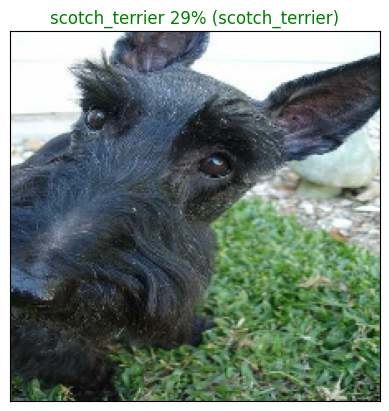

In [68]:
plot_pred(predictions , val_labels , val_images)

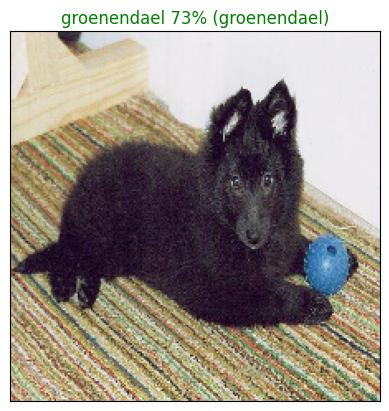

In [69]:
plot_pred(predictions , val_labels , val_images , n=77)

Now we've got one function to visualize our models top prediction , let's make another to view our models top 10 predictions.

this function will :    
* take an `input` of prediction probabilities array and a ground truth array and an integer.
* Find the prediction using `get_pred_label()`
* Find top 10:
   * Prediction probabilities indexex
   * Prediction probabilities values
   * Prediction labels

* Plot the top 10 prediction probability values and labels , coloring the true label green

  

In [70]:
def plot_pred_conf(prediction_probabilities , labels , n=1):
  """
  Plot the top 10 highest prediction confidences along with the truth label for sample n
  """
  pred_prob , true_label = prediction_probabilities[n] , labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)
  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]
  # setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)) ,
                     top_10_pred_values ,
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)) ,
             labels=top_10_pred_labels ,
             rotation="vertical")
  # change color of true label
  if np.isin(true_label , top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass



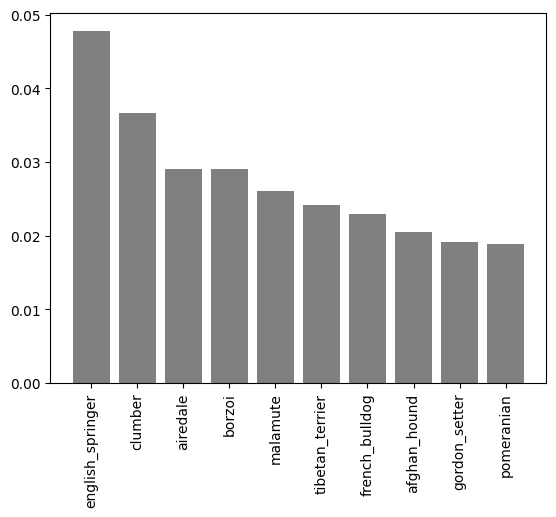

In [53]:
plot_pred_conf(predictions , val_labels ,n=12)

In [68]:
predictions[0].argsort()

array([ 42,  47,  74,  16,   0,  19,  34,  68,  12,  32,  10,  58,  64,
       112,  54,  50,  96,   5,  44, 104,  15, 118, 110,  41,   8,  27,
        48,  71,  40, 105,   3,  28,  46,  11, 115, 113,  38, 114,  53,
        55,   2,  39,   4,  13, 117,  84,  18,  92,  87,  77,  63, 111,
        67,  24, 103,  43,   7, 107,  99,  69,  66,  81,  83,  37,  22,
        51, 102,  29,  75,  80,  35,  78,  56,  59, 101,  76,  94,  82,
       100,  36, 108,  72,  17,  25,  91,  98,  90, 106,  52,  49,  93,
        30,  95,  97,  20,  14,  79,   9,  57,  86,  89,  61,  60,  65,
        73,   1,  33,  21,  85,  23,  88, 109,  31, 116,  62,  45,  26,
         6,  70, 119])

In [ ]:
predictions[0].argsort()[-10:][::-1]

array([ 26,  89, 116,  78,  67,  83,  10,  82,  33, 105])

In [ ]:
unique_breeds[predictions[0].argsort()[-10:][::-1]]

array(['cairn', 'redbone', 'west_highland_white_terrier', 'newfoundland',
       'labrador_retriever', 'otterhound', 'bedlington_terrier',
       'old_english_sheepdog', 'collie', 'standard_poodle'], dtype=object)

  Now we've got some function to help us visualize our predictions and evaluate our model , let's check out a few.

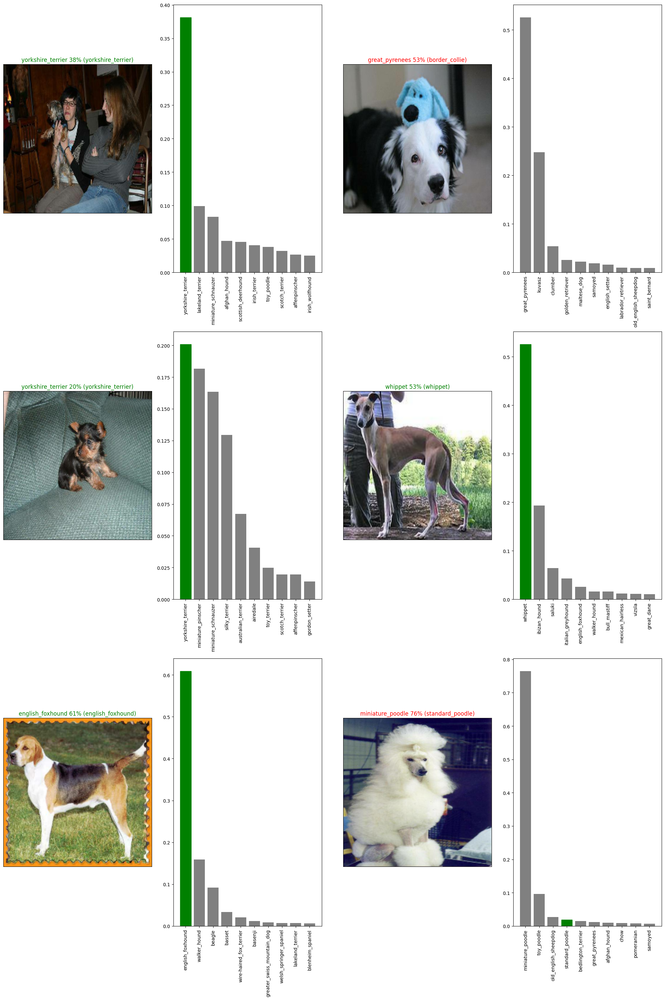

In [71]:
# let's check out a few predictions and their different values
i_mutliplier = 10
num_rows = 3
num_cols = 2
num_images = num_rows * num_cols
plt.figure(figsize=(10*num_cols,10*num_rows))
for i  in range(num_images):
  plt.subplot(num_rows , 2*num_cols , 2*i+1)
  plot_pred(predictions , val_labels , val_images , i+i_mutliplier)
  plt.subplot(num_rows , 2*num_cols , 2*i+2)
  plot_pred_conf(predictions , val_labels , i+i_mutliplier)

plt.tight_layout(h_pad=1.0)
plt.show()

**challenge**: how would you create a confusion matrix with our models predictions and true label.

## Saving and reloadin a trainined model

In [72]:
# Create a function to save a model
def save_model(model , suffix=None):
  """
  Saves a given model to a given model name
  """
  # create a model directory pathname with current time
  modeldir = os.path.join("/content/drive/MyDrive/ML_project/dog vision/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  model_path = modeldir + "-" + suffix + ".h5"
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path


In [177]:
# Create a function to load a trained model
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer":hub.KerasLayer})
  return model

Now we've got functions to save and load a trained model , let's make sure they work !

In [178]:
# save our model traine on 1000 images
save_model(model , suffix="1000-images-mobilenetv2")

NameError: name 'save_model' is not defined

In [89]:
import os

# Check if the model file exists
model_path = '/content/drive/MyDrive/ML_project/dog vision/models/20240914-182407-1000-images-mobilenetv2.h5'

if os.path.exists(model_path):
    print("Model file exists.")
else:
    print("Model file not found.")


Model file exists.


In [90]:
# Load a trained model
loaded_1000_image_model = load_model(model_path)

Loading saved model from: /content/drive/MyDrive/ML_project/dog vision/models/20240914-182407-1000-images-mobilenetv2.h5


In [58]:
# Evaluate the prre-sved model
model.evaluate(val_data)

7/7 ━━━━━━━━━━━━━━━━━━━━ 17s 2s/step - accuracy: 0.0000e+00 - loss: 5.1148


[5.159560680389404, 0.0]

In [91]:
loaded_1000_image_model.evaluate(val_data)

7/7 [==============================] - 10s 1s/step - loss: 1.5077 - accuracy: 0.6350


[1.507749080657959, 0.6349999904632568]

## Training a big dog model (on the full data )

In [92]:
len(X) , len(y)

(10222, 10222)

In [93]:
len(X_train) , len(y_train) , len(X_val) , len(y_val)

(800, 800, 200, 200)

In [94]:
X[:10]

['/content/drive/MyDrive/ML_project/dog vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/drive/MyDrive/ML_project/dog vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '/content/drive/MyDrive/ML_project/dog vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 '/content/drive/MyDrive/ML_project/dog vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '/content/drive/MyDrive/ML_project/dog vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 '/content/drive/MyDrive/ML_project/dog vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 '/content/drive/MyDrive/ML_project/dog vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 '/content/drive/MyDrive/ML_project/dog vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 '/content/drive/MyDrive/ML_project/dog vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 '/content/drive/MyDrive/ML_project/dog vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [95]:
# Create a data batch with the full data set
full_data = create_data_batches(X,y)

creating training batches ...


In [96]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [97]:
# Create a model for a full model
full_model = create_model()

Building model using MobileNetV2


In [98]:
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()
# No validation set when training on all the data , so can't monitor vlidation acuuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor='accuracy',
                                                         patience=3)


**Note:** Running the cell below will take a little while (maybe up to 30 minutes for the epoch) because the GPU we're using in the runtime has a load all of the images into memory.

In [79]:
# Fit the full model to the full data
NUM_EPOCHS = 100
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard,full_model_early_stopping])

Epoch 1/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 1782s 5s/step - accuracy: 0.2736 - loss: 3.0490
Epoch 2/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 52s 152ms/step - accuracy: 0.5654 - loss: 1.4895
Epoch 3/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 48s 149ms/step - accuracy: 0.6608 - loss: 1.1107
Epoch 4/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 47s 148ms/step - accuracy: 0.7179 - loss: 0.9016
Epoch 5/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 82s 148ms/step - accuracy: 0.7821 - loss: 0.6899
Epoch 6/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 47s 148ms/step - accuracy: 0.7983 - loss: 0.6238
Epoch 7/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 84s 154ms/step - accuracy: 0.8400 - loss: 0.4914
Epoch 8/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 80s 147ms/step - accuracy: 0.8487 - loss: 0.4638
Epoch 9/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 83s 151ms/step - accuracy: 0.8724 - loss: 0.3944
Epoch 10/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 82s 150ms/step - accuracy: 0.8974 - loss: 0.3180
Epoch 11/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 81s 147ms/step - accuracy: 0.8868 - loss: 0.3557
Epoch 12/

In [99]:
save_model(full_model , suffix="full-image-set-mobilenetv2")

Saving model to: /content/drive/MyDrive/ML_project/dog vision/models/20240914-182710-full-image-set-mobilenetv2.h5...


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'/content/drive/MyDrive/ML_project/dog vision/models/20240914-182710-full-image-set-mobilenetv2.h5'

In [100]:
import os

# Check if the model file exists
full_data_model_path = '/content/drive/MyDrive/ML_project/dog vision/models/20240914-182710-full-image-set-mobilenetv2.h5'

if os.path.exists(model_path):
    print("Model file exists.")
else:
    print("Model file not found.")


Model file exists.


In [101]:
load_full_model = load_model(full_data_model_path)
#

Loading saved model from: /content/drive/MyDrive/ML_project/dog vision/models/20240914-182710-full-image-set-mobilenetv2.h5


In [66]:
full_model.evaluate(full_data)

320/320 ━━━━━━━━━━━━━━━━━━━━ 984s 3s/step - accuracy: 0.0108 - loss: 5.1086


[5.115777969360352, 0.0097828209400177]

In [102]:
load_full_model.evaluate(full_data)

320/320 [==============================] - 527s 2s/step - loss: 5.0880 - accuracy: 0.0113


[5.087981224060059, 0.011348072439432144]

## Making a prediction on the test dataset

Since our model has been trained on images in the form of Tensor batches , to make predictions on the test data , we'll have to get it into the same format.

luckly we created `created_data_batches()` earlier which can take a list of filenames as input nad conver them into TEsnor Batches.

To make predictions on test data , we'll:
* Get the test images filnames
* Convert the filenames into test data batches using `create_data_batches()` and setting the `test_data` parameter to `True` (since the test data doesn't have labels).
* Make a predictions array by passing the test batches to the `predict()` method called on our model .


In [103]:
# Load test images filenames
test_path = "/content/drive/MyDrive/ML_project/dog vision/test"
test_filenames = [test_path + "/" + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['/content/drive/MyDrive/ML_project/dog vision/test/e7b608110b0e29120d8740f37e85f3d0.jpg',
 '/content/drive/MyDrive/ML_project/dog vision/test/dd026c42cfd91ea64b1fe5db04a18863.jpg',
 '/content/drive/MyDrive/ML_project/dog vision/test/e6b1859592468c8ffc1a73f87b201ba7.jpg',
 '/content/drive/MyDrive/ML_project/dog vision/test/e09a3a40b2ebdf0be72800eefd6931de.jpg',
 '/content/drive/MyDrive/ML_project/dog vision/test/dff4932a639f0bf9b1e693fff89fc898.jpg',
 '/content/drive/MyDrive/ML_project/dog vision/test/e0ccfbe350e0e8bc7bb7e1f95fa07b3b.jpg',
 '/content/drive/MyDrive/ML_project/dog vision/test/de172eece3080506aa3bcf1967f4a90b.jpg',
 '/content/drive/MyDrive/ML_project/dog vision/test/e2d76a91641c11a0609687b83ff9c0b4.jpg',
 '/content/drive/MyDrive/ML_project/dog vision/test/e312dda8d35118c40880c0f331c09509.jpg',
 '/content/drive/MyDrive/ML_project/dog vision/test/e30a97eb637239e3b15c903529e04800.jpg']

In [104]:
test_data = create_data_batches(test_filenames , test_data=True)

In [107]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

**Note**: Calling `predict()` on our full model and passsing it the test data batch will take a long time to run (about an ~ `h)

In [106]:
# Make predection on test data batch using the loaded full model
test_predictions = load_full_model.predict(test_data , verbose=1)

324/324 [==============================] - 1068s 3s/step


In [108]:
# Save predictiions (Numpy array) to csv file (for access later)
np.savetxt("/content/drive/MyDrive/ML_project/dog vision/test_predictions.csv",
           test_predictions,
           delimiter=",")

In [109]:
# Load predictions (Numpy array) From csv file
test_predictions = np.loadtxt("/content/drive/MyDrive/ML_project/dog vision/test_predictions.csv",
                              delimiter=",")

In [111]:
test_predictions = pd.read_csv("/content/drive/MyDrive/ML_project/dog vision/test_predictions.csv")
test_predictions

,8.230177685618400574e-03,7.244483102113008499e-03,1.347718015313148499e-02,1.601038128137588501e-02,1.103541254997253418e-02,1.003306731581687927e-02,6.471421103924512863e-03,7.285490166395902634e-03,4.535734653472900391e-03,3.747175447642803192e-03,...,1.242537423968315125e-02,4.069991409778594971e-03,4.159214440733194351e-03,4.424934275448322296e-03,2.627675421535968781e-03,7.861935533583164215e-03,4.479573108255863190e-03,4.900927189737558365e-03,1.095895073376595974e-03,3.117580432444810867e-03
0,0.008939,0.001968,0.005449,0.011607,0.006790,0.004738,0.006222,0.002917,0.003178,0.006095,...,0.019597,0.017869,0.015630,0.016568,0.005127,0.009161,0.016359,0.011531,0.003948,0.001575
1,0.002657,0.004611,0.007654,0.012839,0.012994,0.003404,0.006119,0.004949,0.004251,0.001883,...,0.005456,0.011035,0.009251,0.010468,0.016759,0.005724,0.006298,0.004708,0.004082,0.005660
2,0.004603,0.003321,0.008817,0.005906,0.022343,0.022167,0.007351,0.005345,0.012586,0.004017,...,0.003823,0.005468,0.011309,0.039264,0.011968,0.008414,0.010880,0.007720,0.004920,0.002252
3,0.006904,0.005909,0.006884,0.008912,0.004370,0.004354,0.012157,0.002294,0.012295,0.007866,...,0.003125,0.013286,0.023025,0.009041,0.003179,0.003365,0.002225,0.003089,0.004379,0.004198
4,0.009081,0.002846,0.008550,0.004100,0.012521,0.021121,0.026978,0.003082,0.012168,0.004782,...,0.001127,0.007784,0.022534,0.014370,0.008175,0.006003,0.007166,0.009291,0.006306,0.003049
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10351,0.006260,0.002820,0.004062,0.004825,0.005258,0.010071,0.006621,0.014478,0.013263,0.003407,...,0.021025,0.011519,0.016904,0.004880,0.017194,0.004023,0.048082,0.008228,0.006059,0.002017
10352,0.008610,0.003800,0.001644,0.006573,0.007813,0.005335,0.008910,0.002552,0.002108,0.002384,...,0.018647,0.019002,0.030218,0.009186,0.040206,0.005939,0.026961,0.011150,0.011286,0.003682
10353,0.007283,0.013094,0.010716,0.010383,0.032156,0.011034,0.002303,0.002673,0.005144,0.005140,...,0.003124,0.010261,0.015668,0.015665,0.009264,0.012494,0.006276,0.008337,0.003683,0.017099
10354,0.009223,0.003400,0.008134,0.006765,0.011891,0.005686,0.004208,0.004294,0.008039,0.012599,...,0.003300,0.006145,0.012984,0.011172,0.004065,0.004951,0.023686,0.010731,0.003871,0.000964


In [116]:
test_predictions.shape  , len(test_predictions)

((10356, 120), 10356)

## Preparing test dataset predictions for Kaggle

Looking at the Kaggle sample submission, we find that it wants our models prediction probaiblity outputs in a DataFrame with an ID and a column for each different dog breed. https://www.kaggle.com/c/dog-breed-identification/overview/evaluation

To get the data in this format, we'll:

* Create a pandas DataFrame with an ID column as well as a column for each dog breed. ✅
* Add data to the ID column by extracting the test image ID's from their filepaths.✅
* Add data (the prediction probabilites) to each of the dog breed columns.✅
* Export the DataFrame as a CSV to submit it to Kaggle.✅

In [118]:
# Create a pandas Dataframe with empty column
pred_df = pd.DataFrame(columns=["id"] + list(unique_breeds))
pred_df

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [123]:
# Append test image's ID to predictions DataFrame
import os
import pandas as pd
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
test_ids[:10]
pred_df['id']=test_ids
pred_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e7b608110b0e29120d8740f37e85f3d0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,dd026c42cfd91ea64b1fe5db04a18863,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,e6b1859592468c8ffc1a73f87b201ba7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,e09a3a40b2ebdf0be72800eefd6931de,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,dff4932a639f0bf9b1e693fff89fc898,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [127]:
# Add the prediction probabilities each dog breed column
pred_df[list(unique_breeds)] = test_predictions
pred_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e7b608110b0e29120d8740f37e85f3d0,0.008939,0.001968,0.005449,0.011607,0.006790,0.004738,0.006222,0.002917,0.003178,...,0.019597,0.017869,0.015630,0.016568,0.005127,0.009161,0.016359,0.011531,0.003948,0.001575
1,dd026c42cfd91ea64b1fe5db04a18863,0.002657,0.004611,0.007654,0.012839,0.012994,0.003404,0.006119,0.004949,0.004251,...,0.005456,0.011035,0.009251,0.010468,0.016759,0.005724,0.006298,0.004708,0.004082,0.005660
2,e6b1859592468c8ffc1a73f87b201ba7,0.004603,0.003321,0.008817,0.005906,0.022343,0.022167,0.007351,0.005345,0.012586,...,0.003823,0.005468,0.011309,0.039264,0.011968,0.008414,0.010880,0.007720,0.004920,0.002252
3,e09a3a40b2ebdf0be72800eefd6931de,0.006904,0.005909,0.006884,0.008912,0.004370,0.004354,0.012157,0.002294,0.012295,...,0.003125,0.013286,0.023025,0.009041,0.003179,0.003365,0.002225,0.003089,0.004379,0.004198
4,dff4932a639f0bf9b1e693fff89fc898,0.009081,0.002846,0.008550,0.004100,0.012521,0.021121,0.026978,0.003082,0.012168,...,0.001127,0.007784,0.022534,0.014370,0.008175,0.006003,0.007166,0.009291,0.006306,0.003049


In [130]:
# Save our predictions dataframe to CSV for submission Kaggle
pred_df.to_csv("/content/drive/MyDrive/ML_project/dog vision/full_model_predictions_submission_1_mobilenetV2.csv" , index=False)


## Making Prediction on customt images

To make predictions on custom images, we'll:

* Get the filepaths of our own images.
* Turn the filepaths into data batches using create_data_batches(). And since our custom images won't have labels, we set the test_data parameter to True.
* Pass the custom image data batch to our model's predict() method.
* Convert the prediction output probabilities to predictions labels.
* Compare the predicted labels to the custom images.

In [131]:
# Get custom image filepaths
custom_path = "/content/drive/MyDrive/ML_project/dog vision/my-dog-photos"
custom_image_paths = [custom_path + "/" + fname for fname in os.listdir(custom_path)]
custom_image_paths


['/content/drive/MyDrive/ML_project/dog vision/my-dog-photos/0a1be1191b5c9d91392bb1e373600259.jpg',
 '/content/drive/MyDrive/ML_project/dog vision/my-dog-photos/0a2b5dcf7aac8c4a282ed09b8b5e93f2.jpg',
 '/content/drive/MyDrive/ML_project/dog vision/my-dog-photos/0a0f82d4557f70718efa26f8a8a7773f.jpg']

In [133]:
# Turn custom images into batch datasets
custom_data = create_data_batches(custom_image_paths , test_data=True)
custom_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [134]:
# Make prediction on the custom data
custom_preds = load_full_model.predict(custom_data)
custom_preds

1/1 [==============================] - 0s 351ms/step


array([[0.00765691, 0.00577005, 0.00356755, 0.00845758, 0.00455921,
        0.00669892, 0.00397302, 0.00674793, 0.00357246, 0.00166304,
        0.01815964, 0.00939464, 0.00210166, 0.00756565, 0.00241575,
        0.00383744, 0.00934192, 0.00266023, 0.01623135, 0.00045797,
        0.00919227, 0.01112868, 0.00747905, 0.00872935, 0.01042586,
        0.01273129, 0.0068459 , 0.00447696, 0.00754798, 0.00510403,
        0.00476445, 0.00900918, 0.0069291 , 0.00407286, 0.01457867,
        0.01599433, 0.00096866, 0.01055211, 0.02977919, 0.01143626,
        0.00271815, 0.00824797, 0.00632399, 0.00900542, 0.00273431,
        0.0086906 , 0.00185974, 0.00629368, 0.0145838 , 0.01537712,
        0.00946047, 0.01430469, 0.00127726, 0.0068986 , 0.01104794,
        0.01133236, 0.00822544, 0.00484949, 0.00250726, 0.0114476 ,
        0.00330891, 0.00706113, 0.04023818, 0.00519113, 0.00296867,
        0.00438409, 0.00999428, 0.0004531 , 0.00261964, 0.00642779,
        0.01659838, 0.00112462, 0.02838578, 0.00

In [135]:
custom_preds.shape

(3, 120)

In [136]:
# Get custom image prediction labels
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['vizsla', 'bedlington_terrier', 'flat-coated_retriever']

In [145]:
# Get custom images (our unbatchify() function won't work since there aren't labels... maybe we could fix this later)
custom_images = []
# Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

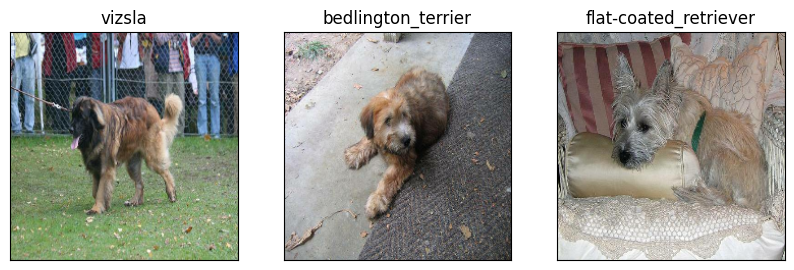

In [146]:
# Check custom image predictions
plt.figure(figsize=(10, 10))
for i, image in enumerate(custom_images):
  plt.subplot(1, 3, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)